<a href="https://colab.research.google.com/github/davidsonsantana89/futebol-simulacao/blob/main/dass_simulacao_campeonato_aplicacao_serie_a_2024.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

Este é o código refatorado do script encontrado [aqui](https://colab.research.google.com/drive/1r77Saxke_Xs2KFA9WC0NwmxP2SqQNdPL?authuser=3)

### BIBLIOTECAS UTILIZADAS NESTE PROJETO

In [ ]:
# bibliotecas a serem utilizadas
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import math
from scipy.stats import poisson,skellam
from tqdm.notebook import tqdm_notebook
plt.style.use('ggplot')

### FUNÇÕES UTILIZADAS NESSE PROJETO

In [ ]:
def MediaGolsTime(serie): # determina a média de gols marcados
    media = np.mean(serie)

    return media


def PontosJogos(dataframe): # determina os pontos obtidos por mandante e visitante, respectivamente
    dataframe['points_home'] = dataframe.apply(lambda row: 3 if (row['FTHG'] > row['FTAG']) else 1 if (row['FTHG'] == row['FTAG']) else 0, axis=1)
    dataframe['points_away'] = dataframe.apply(lambda row: 3 if (row['FTHG'] < row['FTAG']) else 1 if (row['FTHG'] == row['FTAG']) else 0, axis=1)

    return dataframe


def DefineVitoria(dataframe): # determina se foi vitoria ou não para  mandante e visitante, respectivamente
    dataframe['vitoria_home'] = dataframe.apply(lambda row: 1 if (row['FTHG'] > row['FTAG']) else 0, axis=1)
    dataframe['vitoria_away'] = dataframe.apply(lambda row: 1 if (row['FTHG'] < row['FTAG']) else 0, axis=1)

    return dataframe

def GolsMarcadosAteHoje(results, fixtures, registro): # determina o total de gols marcados pelo  mandante e visitante, respectivamente, até a rodada atual (registro)
    gols_home = results[(results['home'] == fixtures.iloc[registro][1]) & (results['data'] <= fixtures.iloc[registro][0])]['FTHG'].sum()
    gols_away = results[(results['away'] == fixtures.iloc[registro][2]) & (results['data'] <= fixtures.iloc[registro][0])]['FTAG'].sum()

    return gols_home, gols_away

def GolsSofridosAteHoje(results, fixtures, registro): # determina o total de gols sofridos pelo  mandante e visitante, respectivamente, até a rodada atual (registro)
    gols_sofridos_home = results[(results['home'] == fixtures.iloc[registro][1]) & (results['data'] <= fixtures.iloc[registro][0])]['FTAG'].sum()
    gols_sofridos_away = results[(results['away'] == fixtures.iloc[registro][2]) & (results['data'] <= fixtures.iloc[registro][0])]['FTHG'].sum()

    return gols_sofridos_home, gols_sofridos_away


def VetorMandante(vetor_jogo_camp_passado, results, fixtures, registro): # código para determinar o vetor do mandante para a partida atual
    gol_h = GolsMarcadosAteHoje(results, fixtures, registro)[0]
    gol_a = GolsSofridosAteHoje(results, fixtures, registro)[0]

    vetor_h, vetor_a = vetor_jogo_camp_passado

    gols_feitos_mandante = sum([vetor_h, gol_h])/(results[results['home'] == fixtures.iloc[i][1]].shape[0] + 1)
    gols_sofridos_mandante = sum([vetor_a, gol_a])/(results[results['home'] == fixtures.iloc[i][1]].shape[0] + 1)

    vetor_mandante = np.array([gols_feitos_mandante, gols_sofridos_mandante])

    return vetor_mandante


def VetorVisitante(vetor_jogo_camp_passado, results, fixtures, registro): # código para determinar o vetor do visitante para a partida atual
    gol_a = GolsMarcadosAteHoje(results, fixtures, registro)[1]
    gol_h = GolsSofridosAteHoje(results, fixtures, registro)[1]

    vetor_h, vetor_a = vetor_jogo_camp_passado

    gols_feitos_visitante = sum([vetor_a, gol_a])/(results[results['away'] == fixtures.iloc[i][1]].shape[0] + 1)
    gols_sofridos_visitante = sum([vetor_h, gol_h])/(results[results['away'] == fixtures.iloc[i][1]].shape[0] + 1)

    vetor_visitante = np.array([gols_feitos_visitante, gols_sofridos_visitante])

    return vetor_visitante


def VetorJogo(vetor_jogo_camp_passado, results, fixtures, registro): # código para determinar o vetor do jogo atual

    gols_feitos_mandante, gols_sofridos_mandante = VetorMandante(vetor_jogo_camp_passado, results, fixtures, registro)

    gols_feitos_visitante, gols_sofridos_visitante = VetorVisitante(vetor_jogo_camp_passado, results, fixtures, registro)

    media_mandante = np.array([gols_feitos_mandante, gols_sofridos_visitante]).mean()
    media_visitante = np.array([gols_feitos_visitante, gols_sofridos_mandante]).mean()

    vetor_jogo = np.array([media_mandante, media_visitante])

    return vetor_jogo


# função que calcula as probabilidades acumuladas de Poisson
def PoissonAcumulada(media_ocorrencias, num_ocorrencias=6):
    distribuicao_poisson = np.array([poisson.pmf(k, media_ocorrencias) for k in range(num_ocorrencias)])
    distr_poisson_acum = np.cumsum(distribuicao_poisson)

    return distr_poisson_acum


def NumGolsMarcados(media_ocorrencias): # Função que prediz o número de gols marcados por uma equipe
    lista = PoissonAcumulada(media_ocorrencias, num_ocorrencias=6)

    x = np.random.rand()
    num_gol = np.searchsorted(lista, x)
    return num_gol


def PontosJogo(gols_home, gols_away):

    if gols_home > gols_away:
        pontos_home, pontos_away = [3, 0]
    elif gols_home == gols_away:
        pontos_home, pontos_away = [1, 1]
    else:
        pontos_home, pontos_away = [0, 3]

    return pontos_home, pontos_away


def GolsSeason(dataframe, time):
    # cálculo de gols pró
    gols_pro_home = dataframe[dataframe['home'] == time]['FTHG'].sum()
    gols_pro_away = dataframe[dataframe['away'] == time]['FTAG'].sum()
    gols_pro = gols_pro_home + gols_pro_away

    # cálculo de gols contra
    gols_contra_home = dataframe[dataframe['home'] == time]['FTAG'].sum()
    gols_contra_away = dataframe[dataframe['away'] == time]['FTHG'].sum()
    gols_contra = gols_contra_home + gols_contra_away

    return (gols_pro, gols_contra)


def SaldoGols(dataframe, time):
    pro, contra = GolsSeason(dataframe, time)
    diff = pro - contra

    return diff


def NumVitorias(dataframe, time):
    vitorias_home = dataframe[dataframe['home'] == time]['vitoria_home'].sum()
    vitorias_away = dataframe[dataframe['away'] == time]['vitoria_away'].sum()
    soma_vitorias = vitorias_home + vitorias_away

    return soma_vitorias


def NumPontos(dataframe, time):
    pontos_home = dataframe[dataframe['home'] == time]['points_home'].sum()
    pontos_away = dataframe[dataframe['away'] == time]['points_away'].sum()
    soma_pontos = pontos_home + pontos_away

    return soma_pontos


def ClassificacaoSeason(dataframe):
    equipes = dataframe['home'].unique()

    lista_classificacao = [(time, NumPontos(dataframe, time),
                            NumVitorias(dataframe, time),
                            SaldoGols(dataframe, time),
                            GolsSeason(dataframe, time)[0]) for time in equipes]

    df_classificacao = pd.DataFrame(lista_classificacao, columns=['equipe',
                                                                  'pontos',
                                                                  'num_vitorias',
                                                                  'gols_pro',
                                                                  'diff'])
    df_classificacao = df_classificacao.sort_values(['pontos',
                                                     'num_vitorias',
                                                     'diff', 'gols_pro'], ascending=False).reset_index(drop=True)
    df_classificacao.insert(0, 'rank', range(1, 21))

    return df_classificacao



### PREPRAÇÃO DOS DADOS

In [ ]:
# endereço com a base de dados de partidas jogadas no ano anterior
url_ano_anterior = 'https://raw.githubusercontent.com/davidsonsantana89/futebol-simulacao/main/base-jogos/brasil/serie-b/serie-b-2023-com-minutos.csv'
df_ano_anterior = pd.read_csv(url_ano_anterior, sep=';')

# endereço com a base de dados de partidas jogadas no ano atual
url_results = 'https://raw.githubusercontent.com/davidsonsantana89/futebol-simulacao/main/base-jogos/brasil/serie-b/2024-serie-b-passado.csv'
df_results = pd.read_csv(url_results, sep=',')
df_results = df_results[['data', 'home', 'away', 'FTHG', 'FTAG']]
df_results = PontosJogos(df_results)
df_results = DefineVitoria(df_results)

# endereço com a base de dados de partidas programadas no ano atual
url_fixtures = 'https://raw.githubusercontent.com/davidsonsantana89/futebol-simulacao/main/base-jogos/brasil/serie-b/2024-serie-b-fixture.csv'
df_fixtures = pd.read_csv(url_fixtures, sep=',')
df_fixtures['FTHG']= np.zeros(df_fixtures.shape[0], dtype=int) # criar coluna de gols mandante com zeros
df_fixtures['FTAG'] = np.zeros(df_fixtures.shape[0], dtype=int) # criar coluna de gols visitante com zeros
df_fixtures['points_home'] = np.zeros(df_fixtures.shape[0], dtype=int)
df_fixtures['points_away'] = np.zeros(df_fixtures.shape[0], dtype=int)
df_fixtures['vitoria_home'] = np.zeros(df_fixtures.shape[0], dtype=int)
df_fixtures['vitoria_away'] = np.zeros(df_fixtures.shape[0], dtype=int)
df_fixtures = df_fixtures.copy()

In [ ]:
# GFM = MÉDIA DE GOLS FEITOS PELO(S) MANDANTE(S)
# GSM = MÉDIA DE GOLS SOFRIDOS PELO(S) MANDANTE(S)
# GFV = MÉDIA DE GOLS FEITO(S) PELO(S) VISITANTE(S) = GSM
# GSV = MÉDIA DE GOLS SOFRIDO(S) PELO(S) VISITANTE(S) = GFM


# GFM DE TODOS OS MANDANTES DE 2023
GFM_PASSADO = MediaGolsTime(df_ano_anterior['FTHG'])

# GSM DE TODOS OS MANDANTES DE 2023
GSM_PASSADO = MediaGolsTime(df_ano_anterior['FTAG'])

# GFV DE TODOS OS VISTITANTES DE 2023
GFV_PASSADO = GSM_PASSADO

# GSV DE TODOS OS VISITANTES DE 2023
GSV_PASSADO = GFM_PASSADO

vetor_campeonato_passado = np.array([GFM_PASSADO, GFV_PASSADO])

### SIMULAÇÃO DE VÁRIOS CAMPEONATOS

In [ ]:
# número de gols marcados por time
k = np.arange(0, 6, 1)

simulacao = pd.DataFrame()

# j: é um campeonato
# i: é uma partida de j
for j in tqdm_notebook(range(1000)):
    for i in tqdm_notebook(range(len(df_fixtures))):

        # vetor do jogo
        vetor_jogo = VetorJogo(vetor_campeonato_passado, df_results, df_fixtures,i)

        gol_home = NumGolsMarcados(vetor_jogo[0]) # num de gols marcados pelo mandante
        gol_away = NumGolsMarcados(vetor_jogo[1]) # num de gols marcados pelo visitante

        df_fixtures.loc[i, 'FTHG'] = gol_home # inserir o num gols preditos para o mandante no dataframe de fixtures
        df_fixtures.loc[i, 'FTAG'] = gol_away # inserir o num gols preditos para o visitante no dataframe de fixtures

        df_fixtures.loc[i, 'points_home'], df_fixtures.loc[i, 'points_away'] = PontosJogo(gol_home, gol_away)

    df_season = pd.concat([df_results, df_fixtures])
    df_classificacao = ClassificacaoSeason(df_season)
    simulacao = pd.concat([simulacao, df_classificacao], ignore_index=True)

  0%|          | 0/1000 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

  0%|          | 0/308 [00:00<?, ?it/s]

### RESULTADO

In [ ]:
# simulacao2 = pd.DataFrame(columns=list(simulacao.equipe))
# simulacao2

## ANÁLISES SPORT CLUB DO RECIFE

In [ ]:
%%time
simulacao_individual = simulacao[simulacao['equipe'] == 'Sport Recife']
simulacao_individual

CPU times: user 4.71 ms, sys: 976 µs, total: 5.69 ms
Wall time: 6.31 ms


,rank,equipe,pontos,num_vitorias,gols_pro,diff
17,18,Sport Recife,36,4,-12,41
24,5,Sport Recife,67,4,17,56
43,4,Sport Recife,59,4,12,46
66,7,Sport Recife,59,4,12,48
86,7,Sport Recife,57,4,7,53
...,...,...,...,...,...,...
19912,13,Sport Recife,47,4,-5,38
19934,15,Sport Recife,42,4,-11,46
19943,4,Sport Recife,60,4,7,48
19962,3,Sport Recife,65,4,21,54


In [ ]:
pontuacao_individual, chances_pts_fn = np.unique(simulacao_individual['pontos'], return_counts=True)
chances_pts_fr = [round(j/sum(chances_pts_fn), 4) for j in chances_pts_fn]
df_pontuacao = pd.DataFrame({'PONTUAÇÃO':pontuacao_individual, 'CHANCE':chances_pts_fr})
df_pontuacao.sort_values('CHANCE', ascending=False).reset_index(drop=True)

,PONTUAÇÃO,CHANCE
0,58,0.066
1,60,0.064
2,56,0.064
3,53,0.056
4,57,0.054
5,52,0.050
6,59,0.050
7,55,0.049
8,62,0.045
9,54,0.044


Text(0.5, 0, 'Pontos')

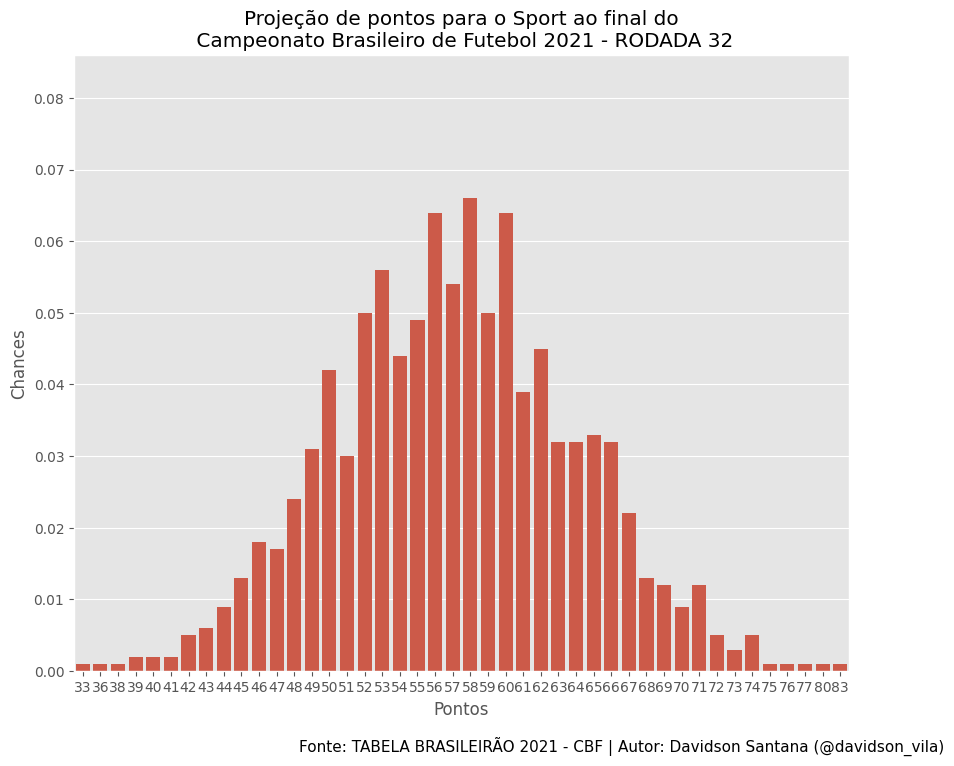

In [ ]:
plt.figure(figsize=(10,8))
h = sns.barplot(x=df_pontuacao['PONTUAÇÃO'], y=df_pontuacao['CHANCE'])
plt.ylabel('Chances')
plt.ylim(0, df_pontuacao['CHANCE'].max() + 0.02)
plt.title('Projeção de pontos para o Sport ao final do\n Campeonato Brasileiro de Futebol 2021 - RODADA 32')
plt.figtext(0.35, 0.009,'Fonte: TABELA BRASILEIRÃO 2021 - CBF | Autor: Davidson Santana (@davidson_vila)', fontsize=11)
plt.xlabel('Pontos')
# plt.savefig('./IMAGENS/rodada-32-projecao-pontos-sport-2021.png', format='png')

In [ ]:
%%time
# posicao_individual = simulacao_individual['posição'].value_counts(ascending=False)
# chances = round(posicao_individual/len(simulacao_individual['posição']), 3)

posicao_individual, chances_fn = np.unique(simulacao_individual['rank'], return_counts=True)

CPU times: user 344 µs, sys: 0 ns, total: 344 µs
Wall time: 350 µs


In [ ]:
chances_fr = [round(i/sum(chances_fn), 4) for i in chances_fn]
chances_time = pd.DataFrame({'POSIÇÃO':posicao_individual, 'CHANCE':chances_fr})

In [ ]:
%%time
chances_time.set_index('POSIÇÃO', drop=True)
chances_time.sort_values('CHANCE', ascending=False)

CPU times: user 3.04 ms, sys: 1e+03 ns, total: 3.04 ms
Wall time: 4.11 ms


,POSIÇÃO,CHANCE
4,5,0.134
3,4,0.120
5,6,0.110
6,7,0.099
7,8,0.093
8,9,0.080
2,3,0.078
1,2,0.051
9,10,0.050
10,11,0.045


In [ ]:
round(chances_time.loc[chances_time['POSIÇÃO']>16]['CHANCE'].sum(), 4)

0.013

In [ ]:
# plt.figure(figsize=(10,8))
# sns.barplot(x=chances_time['POSIÇÃO'], y=chances_time['CHANCE'])
# plt.yticks(np.arange(0, chances.max() + 0.02, 0.025))

In [ ]:
%%time
# pontuacao_individual = simulacao_individual['pontuação'].value_counts(ascending=False)
# pontos = round(pontuacao_individual/len(simulacao_individual['pontuação']), 3)

Wall time: 0 ns


In [ ]:
%%time
pontuacao_individual, posicao_chances = np.unique(simulacao_individual['pontos'], return_counts=True)
pontos_fr = [round(k/sum(posicao_chances), 3) for k in posicao_chances]
df_chances_pontuacao = pd.DataFrame({'PONTUAÇÃO':pontuacao_individual, 'CHANCE':pontos_fr})

CPU times: user 3.08 ms, sys: 2 µs, total: 3.08 ms
Wall time: 2.86 ms


In [ ]:
# df_chances_pontuacao

In [ ]:
# plt.figure(figsize=(10,8))
# sns.barplot(y=df_chances_pontuacao['CHANCE'], x=df_chances_pontuacao['PONTUAÇÃO'])

## CHANCES DE REBAIXAMENTO

In [ ]:
# equipes1 = ['CUIABA', 'ATLETICO', 'FLUMINENSE', 'AMERICA',
#             'SAO PAULO', 'CEARA', 'JUVENTUDE', 'SANTOS',
#             'BAHIA', 'SPORT', 'GREMIO', 'CHAPECOENSE', 'ATHLETICO PARANAENSE']
equipes1 = df_results['home'].unique()

rebaixamento =[]

for equipe in equipes1:
    a = simulacao[simulacao['equipe'] == equipe]
    a_posicao, a_chances_fn = np.unique(a['rank'], return_counts=True)
    a_chances_fr = [round(i/sum(a_chances_fn), 3) for i in a_chances_fn]
    b = pd.DataFrame({'POSIÇÃO':a_posicao, 'CHANCE':a_chances_fr})
    c = b.loc[b['POSIÇÃO']>16]['CHANCE'].sum()
    rebaixamento.append([equipe, c])

tabela_rebaixamento = pd.DataFrame(rebaixamento, columns = ['EQUIPE', 'CHANCE'])
tabela_rebaixamento.sort_values('CHANCE', ascending=False).reset_index(drop=True)

,EQUIPE,CHANCE
0,Botafogo SP,0.741
1,Guarani,0.632
2,Brusque,0.616
3,Ituano,0.589
4,Paysandu PA,0.412
5,Ponte Preta,0.283
6,Amazonas,0.235
7,Novorizontino,0.118
8,Operario,0.087
9,Chapecoense-SC,0.081


## CHANCES DE LIBERTADORES (FASE DE GRUPOS)

In [ ]:
# equipes4 = ['ATLETICO MINEIRO', 'FLAMENGO', 'FORTALEZA',
#             'RED BULL BRAGANTINO', 'PALMEIRAS', 'CORINTHIANS',
#             'INTERNACIONAL', 'ATHLETICO PARANAENSE', 'CUIABA', 'ATLETICO', 'FLUMINENSE', 'AMERICA',
#             'SAO PAULO', 'CEARA', 'JUVENTUDE', 'SANTOS',
#             'BAHIA', 'SPORT', 'GREMIO', 'CHAPECOENSE']

libertadores =[]

for equipe in equipes1:
    x = simulacao[simulacao['equipe'] == equipe]
    x_posicao, x_chances_fn = np.unique(x['rank'], return_counts=True)
    x_chances_fr = [round(i/sum(x_chances_fn), 3) for i in x_chances_fn]
    y = pd.DataFrame({'POSIÇÃO':x_posicao, 'CHANCE':x_chances_fr})
    z = y.loc[y['POSIÇÃO']<5]['CHANCE'].sum()
    libertadores.append([equipe, z])

tabela_libertadores = pd.DataFrame(libertadores, columns = ['EQUIPE', 'CHANCE'])
tabela_libertadores.sort_values('CHANCE', ascending=False).reset_index(drop=True)

,EQUIPE,CHANCE
0,Santos,0.918
1,Goias,0.906
2,America MG,0.679
3,Ceara,0.482
4,Sport Recife,0.266
5,Avai,0.259
6,Mirassol,0.126
7,CRB,0.099
8,Coritiba,0.065
9,Chapecoense-SC,0.054


## CHANCES DE TÍTULO

In [ ]:
# equipes2 = ['ATLETICO MINEIRO', 'FLAMENGO', 'FORTALEZA',
#             'RED BULL BRAGANTINO', 'PALMEIRAS', 'CORINTHIANS',
#             'INTERNACIONAL', 'ATHLETICO PARANAENSE']


titulo =[]

for equipe in equipes1:
    d = simulacao[simulacao['equipe'] == equipe]
    d_posicao, d_chances_fn = np.unique(d['rank'], return_counts=True)
    d_chances_fr = [round(i/sum(d_chances_fn), 4) for i in d_chances_fn]
    e = pd.DataFrame({'POSIÇÃO':d_posicao, 'CHANCE':d_chances_fr})
    f = e.loc[e['POSIÇÃO']<2]['CHANCE'].sum()
    titulo.append([equipe, f])

tabela_titulo = pd.DataFrame(titulo, columns = ['EQUIPE', 'CHANCE'])
tabela_titulo.sort_values('CHANCE', ascending=False).reset_index(drop=True)

,EQUIPE,CHANCE
0,Santos,0.428
1,Goias,0.348
2,America MG,0.108
3,Ceara,0.065
4,Avai,0.021
5,Sport Recife,0.017
6,Mirassol,0.007
7,Coritiba,0.002
8,Vila Nova FC,0.001
9,CRB,0.001


## CHANCES DE SULAMERICANA

In [ ]:
equipes3 = ['CUIABA', 'ATLETICO', 'FLUMINENSE', 'AMERICA',
            'SAO PAULO', 'CEARA', 'JUVENTUDE', 'SANTOS',
            'BAHIA', 'SPORT', 'GREMIO', 'CHAPECOENSE', 'CORINTHIANS',
            'INTERNACIONAL', 'ATHLETICO PARANAENSE']

sulamericana =[]

for equipe in equipes3:
    g = simulacao[simulacao['equipe'] == equipe]
    g_posicao, g_chances_fn = np.unique(g['rank'], return_counts=True)
    g_chances_fr = [round(k/sum(g_chances_fn), 3) for k in g_chances_fn]
    h = pd.DataFrame({'POSIÇÃO':g_posicao, 'CHANCE':g_chances_fr})
    i = h.loc[(h['POSIÇÃO']>=7) & (h['POSIÇÃO']<=12)]['CHANCE'].sum()
    sulamericana.append([equipe, i])

tabela_sulamericana = pd.DataFrame(sulamericana, columns = ['EQUIPE', 'CHANCE'])
tabela_sulamericana.sort_values('CHANCE', ascending=False).reset_index(drop=True)

,EQUIPE,CHANCE
0,CUIABA,0.0
1,ATLETICO,0.0
2,FLUMINENSE,0.0
3,AMERICA,0.0
4,SAO PAULO,0.0
5,CEARA,0.0
6,JUVENTUDE,0.0
7,SANTOS,0.0
8,BAHIA,0.0
9,SPORT,0.0


## ANÁLISES PARA O 16º COLOCADO

In [ ]:
simulacao_pontos = simulacao[simulacao['rank'] == 16]
pontuacao_individual = simulacao_pontos['pontos'].value_counts()
chances_pontos = round(pontuacao_individual/len(simulacao_pontos),4)
chances_pontos

pontos
43    0.197
42    0.178
44    0.166
41    0.142
45    0.094
40    0.070
46    0.058
39    0.042
38    0.026
47    0.018
37    0.005
48    0.002
36    0.002
Name: count, dtype: float64

Text(0.5, 0, 'Pontos')

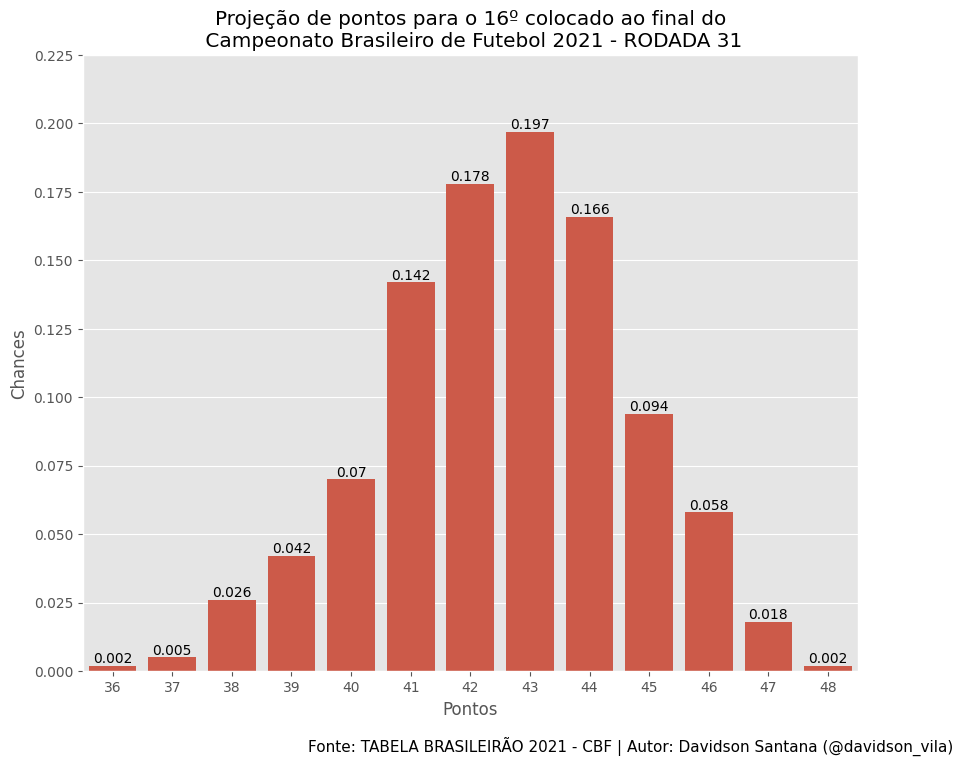

In [ ]:
plt.figure(figsize=(10,8))
g1 = sns.barplot(x=chances_pontos.index, y=chances_pontos)
plt.ylabel('Chances')
plt.yticks(np.arange(0, chances_pontos.max()+0.03, 0.025))
# g1.annotate('25,5%', xy=(45, 0.2551), fontsize=14, xytext=(45, 0.2551))
plt.bar_label(g1.containers[0])
plt.title('Projeção de pontos para o 16º colocado ao final do\n Campeonato Brasileiro de Futebol 2021 - RODADA 31')
plt.figtext(0.35, 0.009,'Fonte: TABELA BRASILEIRÃO 2021 - CBF | Autor: Davidson Santana (@davidson_vila)', fontsize=11)
plt.xlabel('Pontos')
# plt.savefig('./IMAGENS/rodada-32-projecao-pontos-16-colocado-2021.png', format='png')

## ANÁLISES PARA O 1º COLOCADO

In [ ]:
simulacao_campeao = simulacao[simulacao['rank'] == 1]
pontuacao_campeao = simulacao_campeao['pontos'].value_counts()
chances_pontos_campeao = round(pontuacao_campeao/len(simulacao_campeao),4)
chances_pontos_campeao

pontos
73    0.094
75    0.084
74    0.083
76    0.083
77    0.080
71    0.079
72    0.074
70    0.059
79    0.054
78    0.044
69    0.043
80    0.036
81    0.035
68    0.031
82    0.025
67    0.022
83    0.019
66    0.013
84    0.009
85    0.007
65    0.005
86    0.005
87    0.003
89    0.003
88    0.003
63    0.002
62    0.002
90    0.002
92    0.001
Name: count, dtype: float64

Text(0.5, 0, 'Pontos')

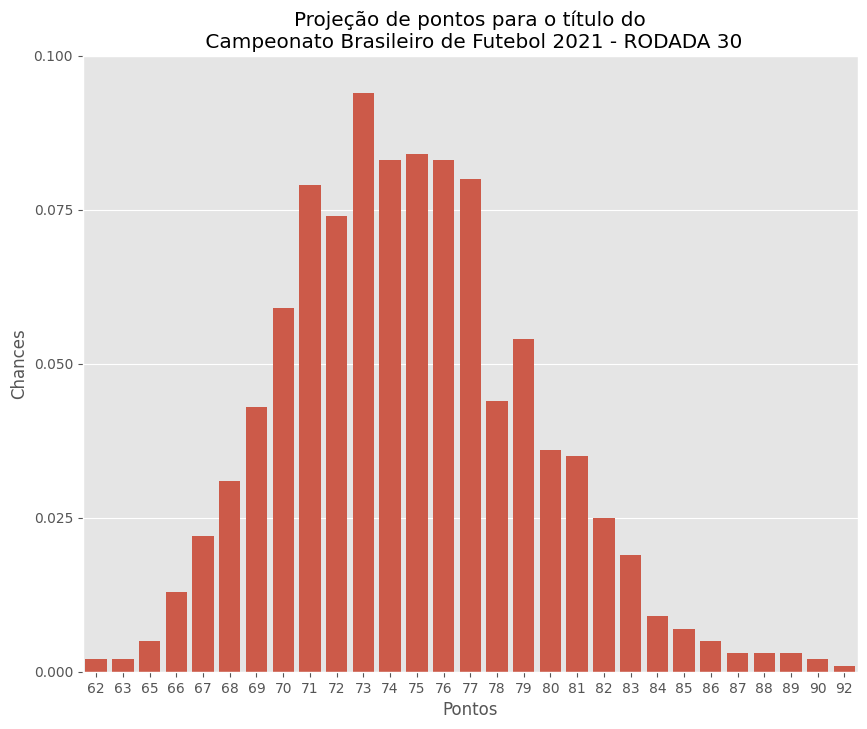

In [ ]:
plt.figure(figsize=(10,8))
g2 = sns.barplot(x=chances_pontos_campeao.index, y=chances_pontos_campeao)
plt.ylabel('Chances')
plt.yticks(np.arange(0, chances_pontos_campeao.max()+0.025, 0.025))
plt.title('Projeção de pontos para o título do\n Campeonato Brasileiro de Futebol 2021 - RODADA 30')
plt.xlabel('Pontos')
# plt.savefig('./IMAGENS/rodada-32-projecao-pontos-campeao-2021.png', format='png')

## ANÁLISES PARA O 4º COLOCADO

In [ ]:
simulacao_campeao = simulacao[simulacao['rank'] == 4]
pontuacao_campeao = simulacao_campeao['pontos'].value_counts()
chances_pontos_campeao = round(pontuacao_campeao/len(simulacao_campeao),4)
chances_pontos_campeao

pontos
63    0.153
62    0.152
64    0.138
61    0.114
60    0.094
65    0.084
59    0.066
66    0.062
67    0.049
58    0.026
68    0.021
69    0.013
57    0.012
71    0.005
56    0.004
70    0.004
55    0.003
Name: count, dtype: float64

Text(0.5, 0, 'Pontos')

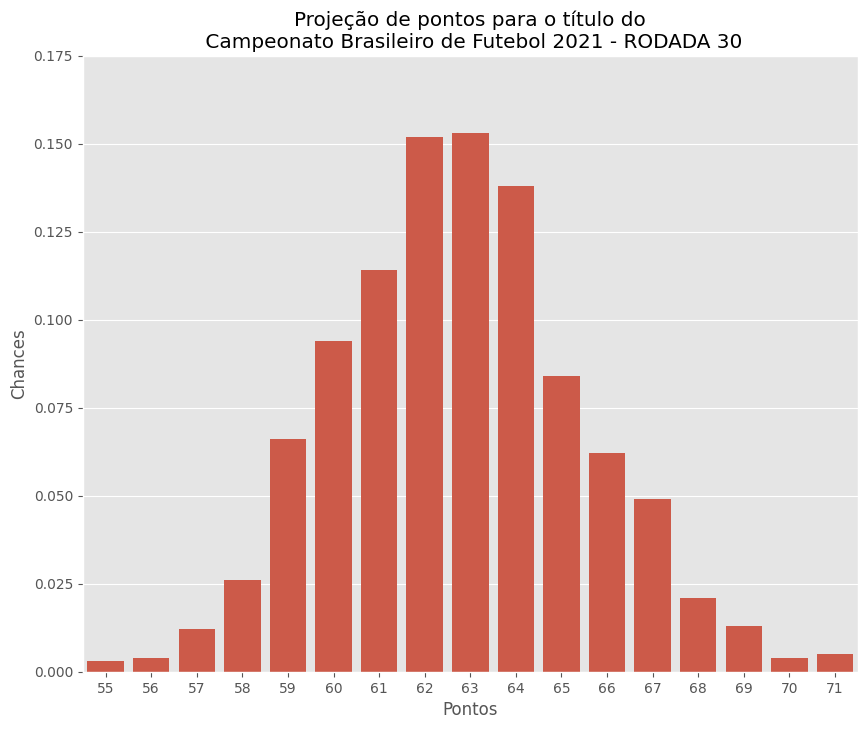

In [ ]:
plt.figure(figsize=(10,8))
g2 = sns.barplot(x=chances_pontos_campeao.index, y=chances_pontos_campeao)
plt.ylabel('Chances')
plt.yticks(np.arange(0, chances_pontos_campeao.max()+0.025, 0.025))
plt.title('Projeção de pontos para o título do\n Campeonato Brasileiro de Futebol 2021 - RODADA 30')
plt.xlabel('Pontos')
# plt.savefig('./IMAGENS/rodada-32-projecao-pontos-campeao-2021.png', format='png')